Loading and installing all necessary libraries:

In [135]:
from google.colab import output
!pip install plotly-express
!pip install nbformat==4.2.0
!pip install plotly
!pip install bubbly

output.clear()

In [136]:
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import plotly_express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode, iplot
import seaborn as sns
from tqdm import tqdm
init_notebook_mode(connected=True)
%config InlineBackend.figure_format = 'svg'

##Introduction:


The topic of my mini-research project is **' The comparative analysis of the countries on the index of happiness'**. The goal is to compare key indicators reflecting the level of happiness of the population of different countries, and the dynamics of their change for 2015-2020 using statistical analysis and machine learning tools.

**The objectives:**

1. To gather the data for 2015-2020 on the happiness level indices.
2. To compare the descriptive statistics across the countries and time periods.
3. To visualize the data in order to draw the additional conclusion for exploratory data analysis.
4. To test the statistical hypotheses on differences between most distinct continents based on selected indicators.
5. To compare different machine learning models trained on the given dataset. 

**Research hypothesis:** 
There is no significant difference in the level of happiness across different countries on average.

**Tools and models used:**

Decision trees, Linear regression, XGboost, Random forest. 

T-test for statistical analysis.

Pandas for data preprocessing and visualization.

Plotly, Pony-express, Matplotlib, Seaborn - for data visualization and graphical analysis.

##EDA.Part 1


In a given data set we observe the reported statistics on the happiness index across different countries. It covers 14 years: 2005 - 2019 years. 

You can find additional descriptions on context and content here: https://www.kaggle.com/unsdsn/world-happiness

Read file ```happiness_index.csv``` into a DataFrame using pandas. The columns:

* ```Country``` - Name of the country.

* ```Happiness Rank``` - Rank of the country based on the Happiness Score.

* ```Happiness Score``` - A metric measured in 2015 by asking the sampled people the question: "How would you rate your happiness on a scale of 0 to 10 where 10 is the happiest."

* ```GDP``` - The extent to which GDP per capita contributes to the calculation of the Happiness Score.

* ```Life expectancy``` - The extent to which Life expectancy contributed to the calculation of the Happiness Score.

* ```Freedom``` - The extent to which Freedom contributed to the calculation of the Happiness Score.

* ```Trust``` - The extent to which Perception of Government Corruption contributes to Happiness Score.




In [137]:
data = pd.read_csv('happiness_index.csv')
data = data[['year', 'Country name', 'Life Ladder','Democratic Quality','Log GDP per capita', 'Healthy life expectancy at birth', 'Freedom to make life choices', 'Confidence in national government']]
data.columns = ['Year', 'Country', 'Happiness Rank', 'Happiness Score', 'GDP', 'Life expectancy', 'Freedom', 'Trust']
len(data)

1848

In [138]:
data.head()

,Year,Country,Happiness Rank,Happiness Score,GDP,Life expectancy,Freedom,Trust
0,2008,Afghanistan,3.723590,-1.929690,7.144916,50.799999,0.718114,0.612072
1,2009,Afghanistan,4.401778,-2.044093,7.314788,51.200001,0.678896,0.611545
2,2010,Afghanistan,4.758381,-1.991810,7.421525,51.599998,0.600127,0.299357
3,2011,Afghanistan,3.831719,-1.919018,7.394349,51.919998,0.495901,0.307386
4,2012,Afghanistan,3.782938,-1.842996,7.480296,52.240002,0.530935,0.435440


1. Let us see if there are NaNs or empty spaces in our data

In [139]:
data.isna().sum()

Year                 0
Country              0
Happiness Rank       0
Happiness Score    149
GDP                 29
Life expectancy     52
Freedom             31
Trust              191
dtype: int64

In [140]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1848 entries, 0 to 1847
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Year             1848 non-null   int64  
 1   Country          1848 non-null   object 
 2   Happiness Rank   1848 non-null   float64
 3   Happiness Score  1699 non-null   float64
 4   GDP              1819 non-null   float64
 5   Life expectancy  1796 non-null   float64
 6   Freedom          1817 non-null   float64
 7   Trust            1657 non-null   float64
dtypes: float64(6), int64(1), object(1)
memory usage: 115.6+ KB


In [141]:
data.describe()

,Year,Happiness Rank,Happiness Score,GDP,Life expectancy,Freedom,Trust
count,1848.000000,1848.000000,1699.000000,1819.000000,1796.000000,1817.000000,1657.000000
mean,2012.848485,5.445810,-0.135018,9.244531,63.169525,0.738467,0.483162
std,3.962437,1.118989,0.874995,1.168422,7.546524,0.143059,0.192098
min,2005.000000,2.375092,-2.448281,6.456574,32.299999,0.257534,0.068769
25%,2010.000000,4.623136,-0.788497,8.309359,58.299999,0.643062,0.336412
50%,2013.000000,5.363165,-0.225939,9.407829,65.099998,0.757478,0.464786
75%,2016.000000,6.268130,0.653066,10.209482,68.384998,0.852387,0.616265
max,2019.000000,8.018934,1.582492,11.728235,77.099998,0.985178,0.993604


2. As far as not each country was recorded each year, you need to filter this table and leave only countries without missing recording for each year.

In [142]:
data.dropna(inplace=True)

3. If we look at the table, we will notice that it is sorted by year and then by happiness rank. It would be easier to view all the records for each country and year at once so that we can track the evolution of the index over time. Let us sort this table by both country name and year. 

In [143]:
data.sort_values(by=['Country', 'Year'], inplace= True)
data.head(15)

,Year,Country,Happiness Rank,Happiness Score,GDP,Life expectancy,Freedom,Trust
0,2008,Afghanistan,3.723590,-1.929690,7.144916,50.799999,0.718114,0.612072
1,2009,Afghanistan,4.401778,-2.044093,7.314788,51.200001,0.678896,0.611545
2,2010,Afghanistan,4.758381,-1.991810,7.421525,51.599998,0.600127,0.299357
3,2011,Afghanistan,3.831719,-1.919018,7.394349,51.919998,0.495901,0.307386
4,2012,Afghanistan,3.782938,-1.842996,7.480296,52.240002,0.530935,0.435440
5,2013,Afghanistan,3.572100,-1.879709,7.499845,52.560001,0.577955,0.482847
6,2014,Afghanistan,3.130896,-1.773257,7.493170,52.880001,0.508514,0.409048
7,2015,Afghanistan,3.982855,-1.844392,7.476808,53.200001,0.388928,0.260557
8,2016,Afghanistan,4.220169,-1.855448,7.471376,53.000000,0.522566,0.324990
9,2017,Afghanistan,2.661718,-1.896539,7.472197,52.799999,0.427011,0.261179


## EDA. Part 2

Let's make some plots to visualize the data. Run the code below and interpret the graph.

In [144]:
sample = ['Burundi', 'Jamaica', 'Sudan', 'Namibia']
df = data[data.Country.isin(sample)].groupby(['Year','Country'], as_index=False)['Happiness Score'].sum()
plot = px.line(df, 
        title='The dynamics of Happiness Score',
        x='Year', 
        y='Happiness Score', 
        color='Country')
plot.show(renderer = 'colab')

The above graph is a line chart.  Negative trend in this graph means: index decreasing. Positive tren means: index increasing. Freedom can positively affect the happiness index since free people are usually happy.

Take a look at histograms and scatter charts for key indicators across the entire dataset.

In [145]:
sns.pairplot(data[['Happiness Score', 
                  'GDP',
                  'Freedom',
                  'Trust']], height=1.6);

From the graph we have following observation:

1. Trust is right skewed. Other variables tends to have normal distribution.(normal skew) 
2. We can see that happiness score have weak correlation with GDP and Life Expectancy.  

Let's compute the correlation matrix. 

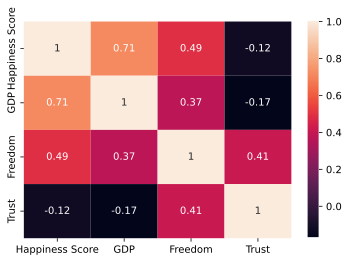

In [146]:
sns.heatmap(data[['Happiness Score', 
                  'GDP', 
                  'Freedom',
                  'Trust',  
                  'Country']].corr(), annot=True);

1)STRONG correlation: Happiness score - GDP, GDP - Freedom 

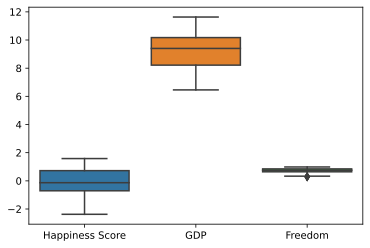

In [147]:
sns.boxplot( data=data[['Happiness Score','GDP','Freedom']])
plt.show()

Let us look at the correlation matrix on the basis of your sample countries:

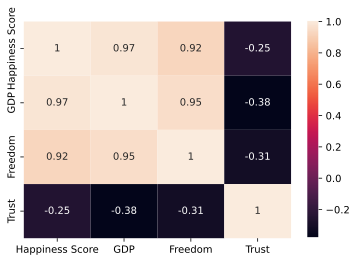

In [148]:
sns.heatmap(data[data.Country.isin(sample)][['Happiness Score', 
                                             'GDP', 
                                             'Freedom',
                                             'Trust', 
                                             'Country']].corr(), annot=True);

Let's make a new variable ```Happiness Level```, which will include the level of happiness: low, medium or high. 

In [149]:
data['Happiness Level'] = pd.cut(data['Happiness Score'], 3, labels=["low", "medium", "high"])

In [150]:
sns.pairplot(data[['Happiness Score', 
                  'GDP',
                   
                  'Freedom',
                  'Trust', 
                  'Happiness Level']], 
             height=1.6, 
             hue="Happiness Level");

The graph above shows: a pairwise relationships between columns. It creates a grid of Axes such that each variable in data will by shared in the y-axis across a single row and in the x-axis across a single column.

Let us do Web parsing and scraping.

It is reasonable to note that we can search for up-to-date information for 2020 and supplement the data.

Follow the link and find a report for 2020 there: https://en.wikipedia.org/wiki/World_Happiness_Report 

In [151]:
import requests
from bs4 import BeautifulSoup



```python3
df = pd.read_html(str(content))[0]
```

It converts our structured document tree with HTML tags into a DataFrame. 

On a provided Wiki page, we will find an HTML tag using Developer Tools, which is for the table with results on the 2020 year, and get the table for that year. 

In [152]:
def download_table_from_page():
    url = 'https://en.wikipedia.org/wiki/World_Happiness_Report'
    response = requests.get(url)
    tree = BeautifulSoup(response.content, 'html.parser')
    # find the first matching table for this pattern
    content = tree.find('table', {'class' : 'wikitable sortable'})
    # convert structured html doc into a DataFrame
    df = pd.read_html(str(content))[0]
    
    return df

download_table_from_page()

,Overall rank,Country or region,Score,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption
0,1,Finland,7.809,1.285,1.500,0.961,0.662,0.160,0.478
1,2,Denmark,7.646,1.327,1.503,0.979,0.665,0.243,0.495
2,3,Switzerland,7.560,1.391,1.472,1.041,0.629,0.269,0.408
3,4,Iceland,7.504,1.327,1.548,1.001,0.662,0.362,0.145
4,5,Norway,7.488,1.424,1.495,1.008,0.670,0.288,0.434
...,...,...,...,...,...,...,...,...,...
148,149,Central African Republic,3.476,0.041,0.000,0.000,0.293,0.254,0.028
149,150,Rwanda,3.312,0.343,0.523,0.572,0.604,0.236,0.486
150,151,Zimbabwe,3.299,0.426,1.048,0.375,0.377,0.151,0.081
151,152,South Sudan,2.817,0.289,0.553,0.209,0.066,0.210,0.111


So, it will be nice to join the report on the 2020 year with the reports on 2005-2019 in order to have a full data set for our analysis.
However, there are at least three problems:
1. The names of the columns differ
2. The content of columns differs
3. Some needed columns are missing, for instance, with a year. 

We will do the tasks to cope with it. 

1. Compare the columns from the data set on 2020 and data on 2005-2019. Rename the selected columns in place in a data set 2020 to the way they named for data 2005-2019: Overall rank => Happiness Rank, Country or region => Country, Score => Happiness Score, etc. till the end. 

2. Create a column Year and fill it with 2020 values for each row. 

3. The code is provided for this task. Concatenate two data sets. Drop the extra column Social support. 

4. Check the missing values. For the column, Happiness Level fill in the missing values according to the value of Happiness Score. 

In [153]:
len(data)

1479

In [154]:
data_2020 = download_table_from_page()
data_2020['Year'] = 2020 
data_2020.head()

,Overall rank,Country or region,Score,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Year
0,1,Finland,7.809,1.285,1.500,0.961,0.662,0.160,0.478,2020
1,2,Denmark,7.646,1.327,1.503,0.979,0.665,0.243,0.495,2020
2,3,Switzerland,7.560,1.391,1.472,1.041,0.629,0.269,0.408,2020
3,4,Iceland,7.504,1.327,1.548,1.001,0.662,0.362,0.145,2020
4,5,Norway,7.488,1.424,1.495,1.008,0.670,0.288,0.434,2020


In [155]:
#get columns that are needed
data_2020 = data_2020[['Year', 'Country or region', 'Overall rank', 'Score',  'GDP per capita', 'Healthy life expectancy', 'Freedom to make life choices', 'Generosity']]

In [156]:
data_2020['Happiness Level'] = pd.cut(data_2020['Score'], 3, labels=["low", "medium", "high"])

In [157]:
data_2020.columns = list(data.columns)
data_2020.head()

,Year,Country,Happiness Rank,Happiness Score,GDP,Life expectancy,Freedom,Trust,Happiness Level
0,2020,Finland,1,7.809,1.285,0.961,0.662,0.160,high
1,2020,Denmark,2,7.646,1.327,0.979,0.665,0.243,high
2,2020,Switzerland,3,7.560,1.391,1.041,0.629,0.269,high
3,2020,Iceland,4,7.504,1.327,1.001,0.662,0.362,high
4,2020,Norway,5,7.488,1.424,1.008,0.670,0.288,high


In [158]:
# concat 2020 with data of previous years
new_df = pd.concat([data, data_2020])
new_df.head()

,Year,Country,Happiness Rank,Happiness Score,GDP,Life expectancy,Freedom,Trust,Happiness Level
0,2008,Afghanistan,3.723590,-1.929690,7.144916,50.799999,0.718114,0.612072,low
1,2009,Afghanistan,4.401778,-2.044093,7.314788,51.200001,0.678896,0.611545,low
2,2010,Afghanistan,4.758381,-1.991810,7.421525,51.599998,0.600127,0.299357,low
3,2011,Afghanistan,3.831719,-1.919018,7.394349,51.919998,0.495901,0.307386,low
4,2012,Afghanistan,3.782938,-1.842996,7.480296,52.240002,0.530935,0.435440,low


In [159]:
import numpy as np
import scipy.stats as st
a = new_df[new_df['Year'] == 2020]['Happiness Score']
st.t.interval(0.95, len(a)-1, loc=np.mean(a), scale=st.sem(a))

(5.295594327793189, 5.650915476128379)

the average happiness score of the entire population lies between 5.295594327793189 and 5.650915476128379 with 95 % confidence

In [160]:
def each_year_ci(ye):
  a = new_df[new_df['Year'] == ye]['Happiness Score']
  return st.t.interval(0.95, len(a)-1, loc=np.mean(a), scale=st.sem(a))
yearss = [2015, 2016, 2017, 2018, 2020]
for i in yearss:
  print(f'Conf Int for {i} is: {each_year_ci(i)}')

Conf Int for 2015 is: (-0.2008796841917701, 0.10914979468777009)
Conf Int for 2016 is: (-0.215855920426405, 0.098980046874405)
Conf Int for 2017 is: (-0.18192779593142971, 0.11904656093918164)
Conf Int for 2018 is: (-0.17581010584339185, 0.12944798081859848)
Conf Int for 2020 is: (5.295594327793189, 5.650915476128379)


## Machine Learning part:

In [161]:
data

,Year,Country,Happiness Rank,Happiness Score,GDP,Life expectancy,Freedom,Trust,Happiness Level
0,2008,Afghanistan,3.723590,-1.929690,7.144916,50.799999,0.718114,0.612072,low
1,2009,Afghanistan,4.401778,-2.044093,7.314788,51.200001,0.678896,0.611545,low
2,2010,Afghanistan,4.758381,-1.991810,7.421525,51.599998,0.600127,0.299357,low
3,2011,Afghanistan,3.831719,-1.919018,7.394349,51.919998,0.495901,0.307386,low
4,2012,Afghanistan,3.782938,-1.842996,7.480296,52.240002,0.530935,0.435440,low
...,...,...,...,...,...,...,...,...,...
1842,2014,Zimbabwe,4.184451,-0.985267,7.826639,52.380001,0.642034,0.566209,medium
1843,2015,Zimbabwe,3.703191,-0.892030,7.827643,53.799999,0.667193,0.590012,medium
1844,2016,Zimbabwe,3.735400,-0.900462,7.819675,54.400002,0.732971,0.699344,medium
1845,2017,Zimbabwe,3.638300,-0.952548,7.851042,55.000000,0.752826,0.682647,medium


Before we train our models we have to define our target and predictors then we have to split the data into train and test sets: 

**Predictors:** Happiness Rank, Happiness Score, GDP, Freedom, Trust

**Target:** Life expectancy


In [162]:
from sklearn.model_selection import train_test_split

In [204]:
X = data[['Happiness Rank', 'Happiness Score', 'GDP', 'Freedom', 'Trust']]
y = data['Life expectancy']

In [199]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.3) # 70% train and 30% test

Let us try our first model: GradientBoostingRegressor


To compare models we use the metrics which is called mean squared error. The less this metric value the better is model

In [173]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error

gb = GradientBoostingRegressor(n_estimators=380, loss='ls', learning_rate=0.061, max_depth=4,subsample=0.85)
gb.fit(X_train, y_train)
y_pred = gb.predict(X_test)
score = np.sqrt(mean_squared_error(y_test, y_pred))
print('RMSE:', score)

RMSE: 3.08124216077586


Second model is XGboost regressor

In [166]:
import xgboost as xgb

xg_reg = xgb.XGBRegressor(learning_rate = 0.01,                         
                          n_estimators = 375,
                          objective= 'reg:squarederror', 
                          booster = 'gbtree')
xg_reg.fit(X_train, y_train)
y_pred = xg_reg.predict(X_test)
score = np.sqrt(mean_squared_error(y_test, y_pred))
print('RMSE:', score)

RMSE: 3.6895742940509115


Let us plot the tree for Xgb

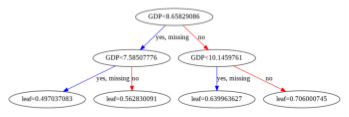

In [183]:
from xgboost import plot_tree
plot_tree(xg_reg)
plt.show()

Third model is RandomForestRegressor

In [202]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(n_estimators=800)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
score = np.sqrt(mean_squared_error(y_test, y_pred))
print('RMSE:', score)

RMSE: 2.965739893107243


Let us plot the tree for Random Forest

In [207]:
from sklearn import tree
plt.figure(figsize=(15,10))
_ = tree.plot_tree(rf.estimators_[0], feature_names=X.columns, filled=True)

Fourth model simple linear regression

In [201]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression(normalize=True)
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
score = np.sqrt(mean_squared_error(y_test, y_pred))
print('RMSE:', score)

RMSE: 3.7357610452348875


As we can see from mean squared error metric the best model is Random Forest. The explanation is that tree is a very complex model that fits data very well.